# Übung 1: Diskretisierung

## Bearbeitungszeitraum

**Bearbeitungsbeginn:** 30.09.2022
<br>
**Abgabe:** 28.10.2022, 23:55 Uhr

---

## Aufgabenbeschreibung

Ziel dieser Übung ist die Einführung in die Bildverarbeitung mit Python. Sie sollen Bilder einlesen, visualisieren und konvertieren können. Zudem sollen Sie lernen, wie Farb-/Grauwerte eines Bildes manipuliert werden können. 
Sie sollen sich zur Bearbeitung dieser Aufgabe mit den bereits vorgestellten imaging libraries beschäftigen und sie einsetzen.

Für die Visualisierung kann das *matplotlib*-Paket verwendet werden. Alle Diagramme sollen *inline* in diesem Notebook ausgegeben werden. Alle interaktiven Inhalte sollen unter Venwendung der Funktionen des Pakets *ipywidgets* realisiert werden.


**Hinweise zur Abgabe**

- Füllen Sie unbedingt die erste Zelle unterhalb der Überschrift mit Name und Matrikelnummer aus!
- Entfernen Sie vor dem Upload alle Ausgaben aus dem Notebook!
- Die Bilddatei muss nicht abgegeben werden.


### Viel Erfolg!

In [1]:
#imports 

%matplotlib inline
import matplotlib
from matplotlib import pyplot as plt
from ipywidgets import interact, widgets
!pip3 install opencv_python
import numpy as np
import cv2
import scipy #sklearn altında bunun

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


### 1. Einlesen, Visualisierung und Konvertierung 
- 1.1. Lesen sie die Datei "Schwarm.jpg" ein.
Visualisieren Sie das, in der Datei enthaltene Bild (verwenden Sie die Funktionen `imshow` und `show`). Optional kann auch die cv2.imread-Funktion benutzt werden.
- 1.2. Führen Sie eine einfache, Schwellwert-basierte Konvertierung des Originalbildes durch, in dem Sie die `threshold`- Funktion (mit dem input value `cv2.THRESH_BINARY`) aus der `cv2`-Bibliothek verwenden. 
Visualisieren Sie beide Bilder mit Hilfe der `subplot`-Funktion in einer Zeile dar.
- 1.3. Analysieren Sie die Array-Werte des neu erzeugten Bildes. Was hat die Thresholding-Funktion bewirkt? Nach welchem Kriterium wurden die einzelnen Pixelwerte verändert? (Stichpunktartige Antwort)

***Anmerkung:*** Nachdem Sie bei der ersten Aufgabe BGR in ein GRAY-Bild umgewandelt haben, denken Sie dran plt.imshow(image, cmap='binary‘) zu setzen, damit das Bild nicht in gelb/lila dargestellt wird.

In [2]:
# function für zeigen 2 images

def show2images(img1, img2):
    figure, img_array = plt.subplots(1,2, figsize = (40,40))
    img_array[0].imshow(img1)
    img_array[1].imshow(img2)

## 1.1

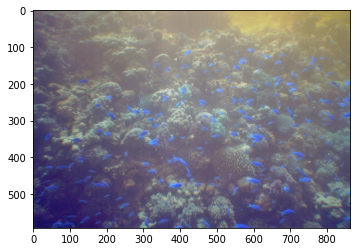

In [3]:
# einlesen schwarm

img_path = r"Schwarm.jpg"
bgr_img = cv2.imread(img_path) # img ist ein vector
plt.imshow(bgr_img)

## 1.2

In [ ]:
# matplotlib uses RGB but CV2 uses BGR so we need to convert them
def bgr2rgb(img):
    rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return rgb_img

# convert gray
def rgb2gray(img):
    img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) # yine bgr veriyor
    img = bgr2rgb(img)
    return img

# threshold
def threshold(img, num1, num2):
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    ret, img = cv2.threshold(img,num1, num2 ,cv2.THRESH_BINARY)
    img = bgr2rgb(img)
    return img

In [ ]:
#convert from bgr to rgb

rgb_img = bgr2rgb(bgr_img)
rgb_thresh_img = threshold(rgb_img, 127, 255)

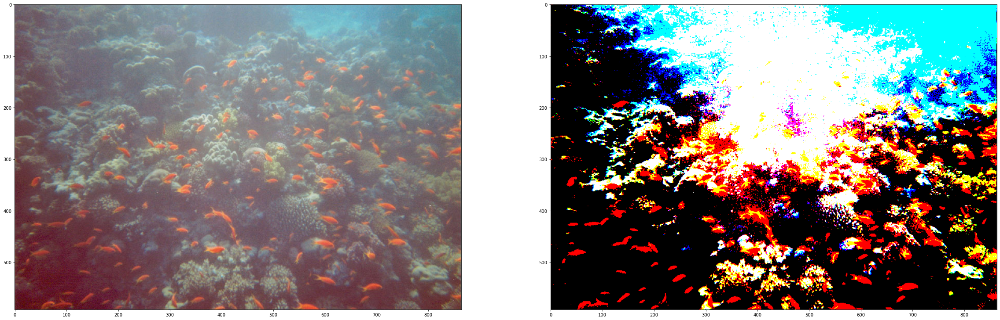

In [ ]:
# beide image
show2images(rgb_img, rgb_thresh_img)


In [ ]:
#convert rgb to gray
gray_img = rgb2gray(rgb_img)
gray_thresh_img = threshold(gray_img, 127,255)

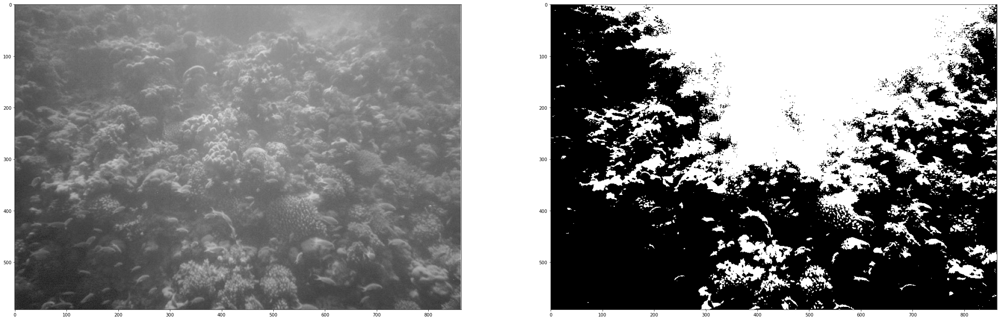

In [ ]:
show2images(gray_img, gray_thresh_img)


### 2. Binärbild erzeugen

**Interaktive Threshold-Eingabe** 

Das Ziel dieser Aufgabe ist es, aus dem farbigen "Schwarm.jpg" ein Binärbild (also ein s/w-Bild!) zu erzeugen, da Binärbilder die Grundvoraussetzung von vielen Bildverarbeitungsoperationen sind.
Bildverarbeitungsbibliotheken wie `scipy` bieten bereits robuste Schwellwert-basierte Funktionen, die Sie sich gerne anschauen und auch testweise anwenden können. 
Für diese Teilaufgabe sollten Sie jedoch einen Slider implementieren, über den ein Schwellenwert (Grenzen 0 und 255, Schrittweite 1, Standardwert 127) für eine Binärkonvertierung festgelegt werden kann. Konvertieren Sie Originalbild unter Verwendung des Schwellenwertes in ein Binärbild. Eine einfache Konvertierung kann durch folgende Zeile erreicht werden: binary_image = (image >= schwellenwert) * 1. 

***Hinweis:*** 
Nutzen Sie die Funktionen zur Erstellung einer interaktiven Visualisierung aus dem ipywidgets-Paket (siehe auch Demo-Notebook -> Beispiel Gauss-Filter).

In [ ]:
# convert gray image into black n white
def gray2bw(img):
    ret, img  = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)
    img = bgr2rgb(img)
    return img


In [ ]:
def binary_slider(threshold):
    #create figure 
    fig, arr = plt.subplots(figsize = (10,10))
    #threshod image
    ret, img  = cv2.threshold(gray_img, threshold, 255, cv2.THRESH_BINARY)
    #show image
    arr.imshow(img) # because we give one image, we dont say arr[num]
    
    
interact(binary_slider, threshold=widgets.IntSlider(min=0,max=255,step=1,value=127) )

interactive(children=(IntSlider(value=127, description='threshold', max=255), Output()), _dom_classes=('widget…

<function __main__.binary_slider(threshold)>

### 3. Diskretisierung

Bearbeiten Sie das Originalbild "Schwarm.jpg", indem Sie folgende Operationen durchführen:

- 3.1. Anzahl der Graustufen reduzieren (4 Stufen: 128, 64, 32, 16). Nehmen Sie hier als Ausgangsbild das Grauwert-transformierte Originalbild.
- 3.2. Anzahl der Bildpunkte reduzieren (512x512, 256x256, 128x128, 32x32) 
- 3.2. Anzahl der Farbstufen reduzieren (in 4 Stufen)

Visualisieren Sie diese Teilaufgaben jeweils mit Hilfe der `subplot`-Funktion in einem 2x2-Raster.

***Hinweis:*** 
- Es ist Ihnen überlassen, welche Libraries bzw. welche Funktionen Sie hierfür verwenden. Wichtig ist, dass Sie die Vorgehensweise der eingesetzten Algorithmen nachvollziehen und wiedergeben können!
- Beschreiben Sie bei jeder Teilaufgabe den Ablauf Ihres Algorithmus (stichpunktartige Wiedergabe reicht aus)
- Sie dürfen auch die, in der Vorlesung vorgestellten Algorithmen `Fehlerdiffusion` und `Median Cut` einsetzen, um vorallem eine Grau-/Farbwertreduktion durchzuführen

## 3.1

In [ ]:

#we are giving gray image & level as number
def reduce_grayscale(img, level):
    
    size = img.shape
    #print("img size: ", size)
    row = size[0]
    col = size[1]
    
    for r in range(row):
        for c in range(col):
            pixel_val = img[r][c] # gives (1,3) array
            #print(pixel_val)
            my_mod = pixel_val % level
            #print(my_mod)
            if my_mod[0] != 0:
                pixel_val += level - my_mod
                if pixel_val.all() > 255:
                    pixel_val = 255
            img[r][c] = pixel_val
            
    return img

grayscale128_img = reduce_grayscale(gray_img.copy(), 2)
grayscale64_img = reduce_grayscale(gray_img.copy(), 4)
grayscale32_img = reduce_grayscale(gray_img.copy(), 8)
grayscale16_img = reduce_grayscale(gray_img.copy(), 16)

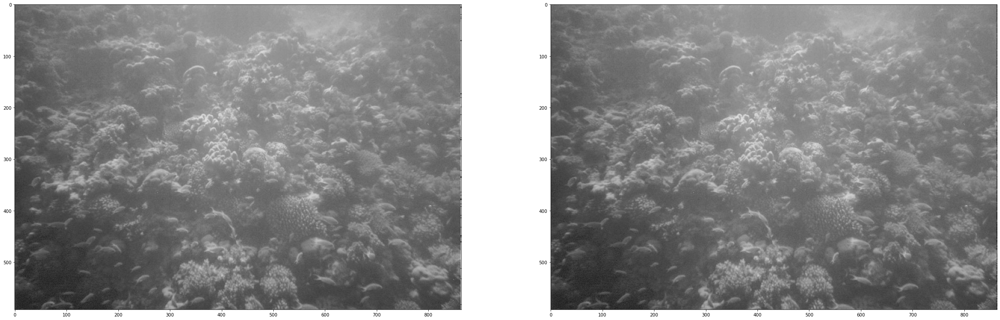

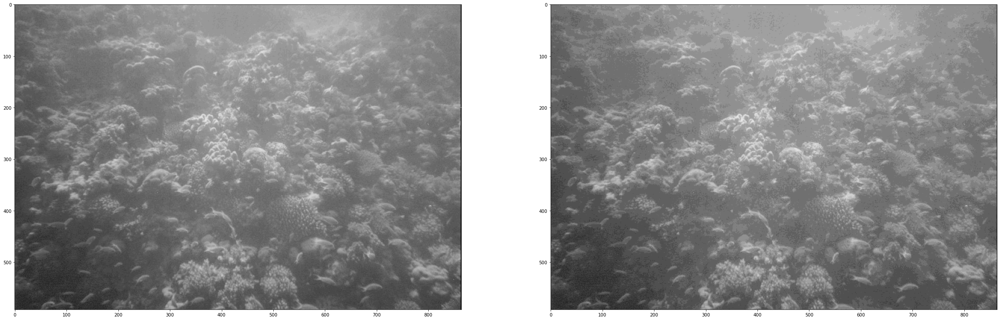

In [ ]:

show2images(grayscale128_img, grayscale64_img)
show2images(grayscale32_img, grayscale16_img)


## 3.2

In [ ]:
# cut image from center by using width and height

def crop_center(img, w, h):
    size = img.shape
    print("img size in the beginning: " , size)
    
    startx = (size[0] // 2) - int(w/2)  # find middle x value 
    starty = (size[1] // 2) - int(h/2)  # find middle y value
    
    new_img = img[startx:startx + w, starty:starty + h]
    
    print("img size at the end : ", new_img.shape)
    return new_img


img size in the beginning:  (592, 864, 3)
img size at the end :  (512, 512, 3)


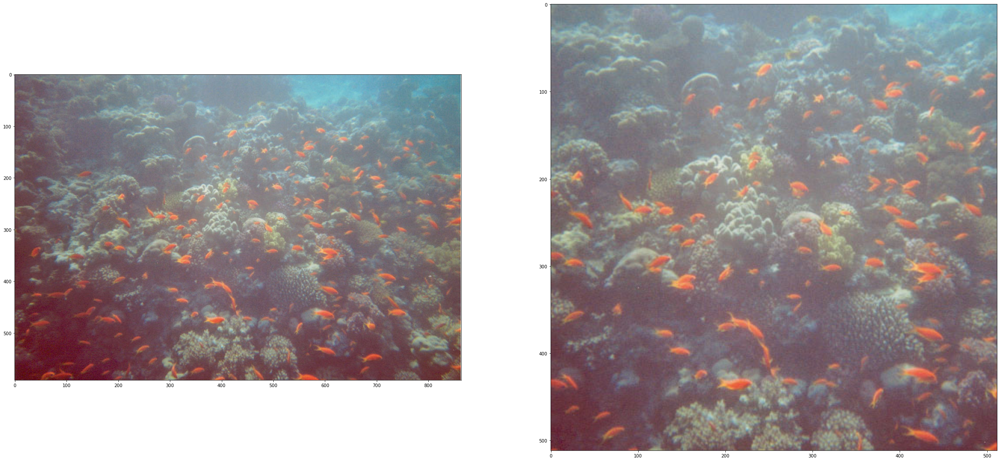

In [ ]:
cropped_img = crop_center(rgb_img, 512,512)
show2images(rgb_img, cropped_img)

In [ ]:
# resize image by using c2 function
def resize(img, row, col):
    img = cv2.resize(img, (row,col), cv2.INTER_AREA)
    return img


In [ ]:
resized512_img = resize(rgb_img, 512, 512)
resized256_img = resize(rgb_img, 256, 256)
resized128_img = resize(rgb_img, 128, 128)
resized32_img = resize(rgb_img, 32, 32)


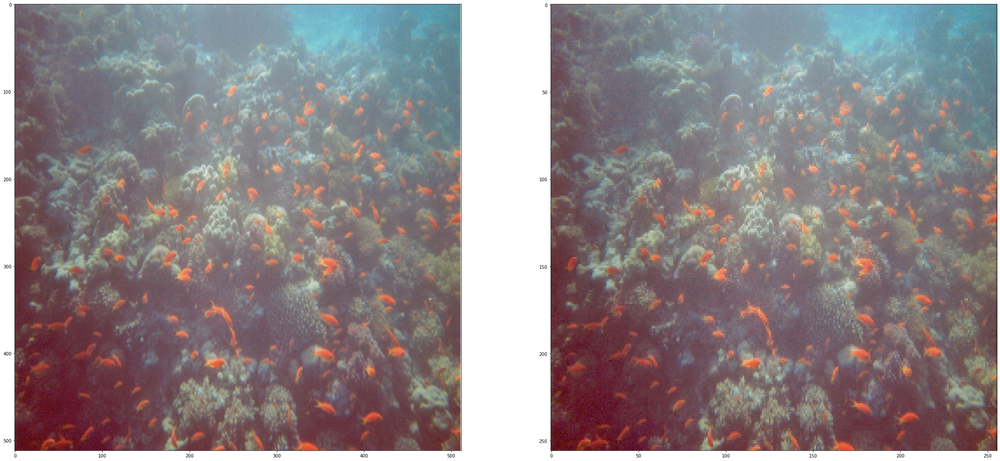

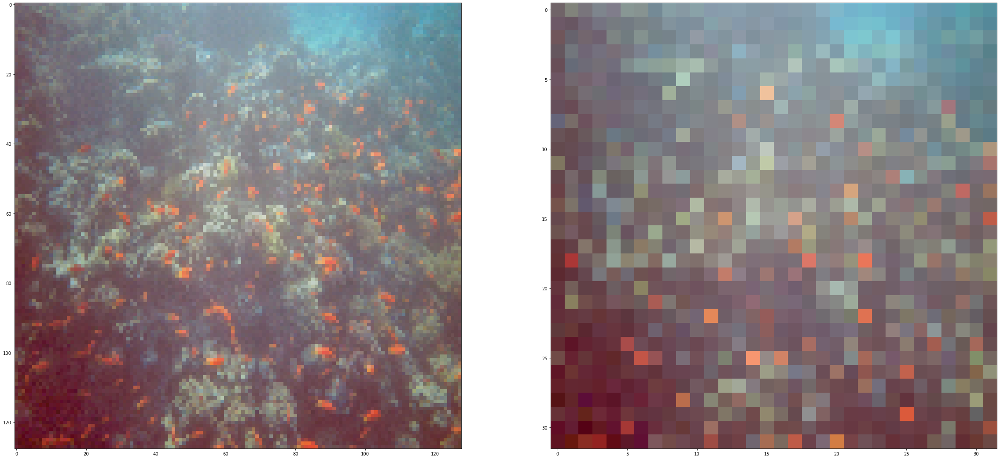

In [ ]:
show2images(resized512_img,resized256_img)
show2images(resized128_img,resized32_img)

## 3.3

In [ ]:
# convert image array into (1,x) array

def flatten_img(img):
    #print("img array size in the beginning: ", img.shape)
    
    flattened_img_array = []
    for rindex, rows in enumerate(img):
        for cindex, color in enumerate(rows):
            flattened_img_array.append([color[0],color[1],color[2],rindex, cindex]) # it is a list now
            
    #print("img array size at the end: ", np.array(flattened_img_array).shape)
    return np.array(flattened_img_array) #convert into array


In [ ]:
flatten_imgx = flatten_img(rgb_img)


In [ ]:
# what does split into buckets?

# 1. en yuksek aralıga ulastıgı degeri bul
print(flatten_imgx[:,0])
print(np.min(flatten_imgx[:,0]))
print(flatten_imgx[:,0] - np.min(flatten_imgx[:,0]))
print("red: ", np.max(flatten_imgx[:,0] - np.min(flatten_imgx[:,0])))

print(flatten_imgx[:,1])
print(np.min(flatten_imgx[:,1]))
print(flatten_imgx[:,1] - np.min(flatten_imgx[:,1]))
print("green: ", np.max(flatten_imgx[:,1] - np.min(flatten_imgx[:,1])))

print(flatten_imgx[:,2])
print(np.min(flatten_imgx[:,2]))
print(flatten_imgx[:,2] - np.min(flatten_imgx[:,2]))
print("blue: ", np.max(flatten_imgx[:,2] - np.min(flatten_imgx[:,2])))

# 2. sort values by most ranged color
print(flatten_imgx[:,2].argsort()) # sortes array and gives indices of them
print(flatten_imgx[flatten_imgx[:,2].argsort()])
print(flatten_imgx.shape)

# 3.split 2 buckets
print( int((len(flatten_imgx)+1)/2))

[131 135 138 ... 110  75 254]
50
[ 81  85  88 ...  60  25 204]
red:  205
[110 110 109 ...  63  35 250]
0
[110 110 109 ...  63  35 250]
green:  255
[117 116 113 ...  53  33 247]
0
[117 116 113 ...  53  33 247]
blue:  255
[502095 495100 467488 ... 143423 141695 235871]
[[117  41   0 581 111]
 [ 87  19   0 573  28]
 [ 95  10   0 541  64]
 ...
 [255 254 255 165 863]
 [255 254 255 163 863]
 [252 255 255 272 863]]
(511488, 5)
255744


In [ ]:
def median_cut_quantize(img, img_arr):
    # when it reaches the end, color quantize
    #print("to quantize: ", len(img_arr))
    r_average = np.mean(img_arr[:,0])
    g_average = np.mean(img_arr[:,1])
    b_average = np.mean(img_arr[:,2])
    
    for data in img_arr:
        img[data[3]][data[4]] = [r_average, g_average, b_average]
    


In [ ]:
def split_into_buckets(img, img_arr, depth):
    
    #if there is no image
    if len(img_arr) == 0:
        return 
    
    #if there is no depth to split anymore
    if depth == 0:
        median_cut_quantize(img, img_arr)
        return
   
    # find which one have highest range (max-min is the most)
    r_range = np.max(img_arr[:,0]) - np.min(img_arr[:,0]) #red
    g_range = np.max(img_arr[:,1]) - np.min(img_arr[:,1]) #green
    b_range = np.max(img_arr[:,2]) - np.min(img_arr[:,2]) #blue
    
    space_with_highest_range = 0

    if r_range >= b_range and r_range >= g_range:
        space_with_highest_range = 0
    elif g_range >= r_range and g_range >= b_range:
        space_with_highest_range = 1
    elif b_range >= r_range and b_range >= g_range:
        space_with_highest_range = 2

    #print("space_with_highest_range:",space_with_highest_range)

    # sort the image pixels by color space with highest range 
    # and find the median and divide the array.
    
    img_arr = img_arr[img_arr[:,space_with_highest_range].argsort()]
    median_index = int((len(img_arr)+1)/2)
    #print("median_index:", median_index)

    
    #split the array into two buckets along the median
    split_into_buckets(img, img_arr[0:median_index], depth-1)
    split_into_buckets(img, img_arr[median_index:], depth-1)


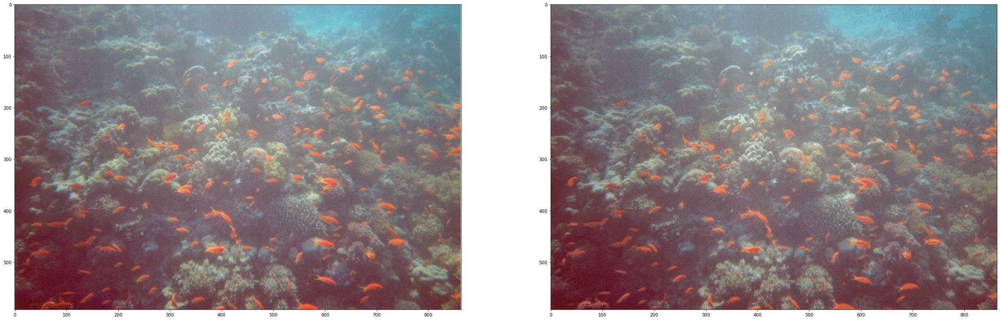

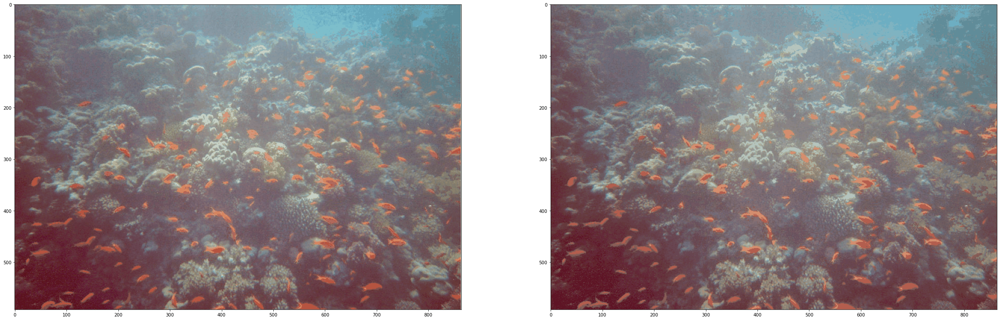

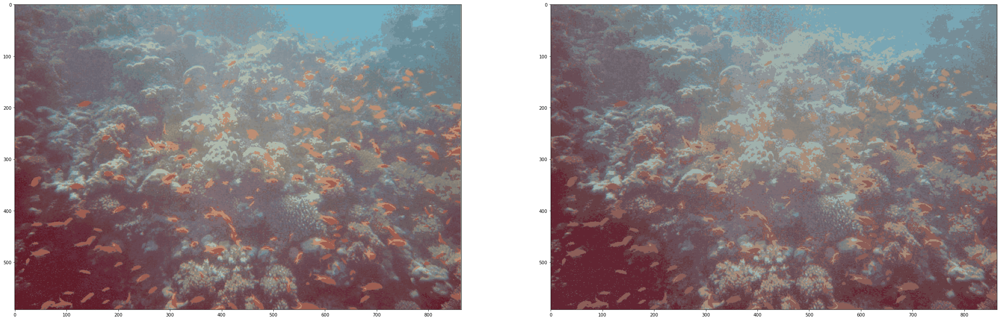

In [ ]:
# calculations will be applied on these pictures
reduced16_img = rgb_img.copy()
reduced32_img = rgb_img.copy()
reduced64_img = rgb_img.copy()
reduced128_img = rgb_img.copy()
reduced256_img = rgb_img.copy()

# the 3rd parameter represents how many colors are needed in the power of 2. If the parameter 
# passed is 4 its means 2^4 = 16 colors because everytime we split 2 
split_into_buckets(reduced16_img, flatten_img(rgb_img), 4)
split_into_buckets(reduced32_img, flatten_img(rgb_img), 5)
split_into_buckets(reduced64_img, flatten_img(rgb_img), 6)
split_into_buckets(reduced128_img, flatten_img(rgb_img), 7)
split_into_buckets(reduced256_img, flatten_img(rgb_img), 8)



show2images(rgb_img,reduced256_img)
show2images(reduced128_img,reduced64_img)
show2images(reduced32_img,reduced16_img)